# OpenHSI Capture

To start, having installed all listed dependencies, I'm going to follow the [quick start](https://openhsi.github.io/openhsi/tutorial_camera.html) page on the OpenHSI github.

I have set up all software and the camera is connected and powered.

I'm not sure about network setup, given I'm connected directly I have set my ethernet to IP 192.168.42.1/24 with no gateway to mirror the ip printed on the camera (192.168.42.0/24)

Note: if this data capture is to be accurate the this [link](https://openhsi.github.io/openhsi/tutorial_camera.html#Getting-surface-reflectance) should be followed to ensure that the calibration is correct.

## Collecting a datacube

In [212]:
from openhsi.cameras import *
import time

json_path = "assets/OpenHSI-11_settings_Mono12_bin2.json"
pkl_path  = "assets/OpenHSI-11_calibration_Mono12_bin2_window.pkl"

# time.sleep(5)

with LucidCamera(n_lines        = 650,
                 processing_lvl = -1,
                 
                 pkl_path       = pkl_path,
                 json_path      = json_path,
                 exposure_ms    = 10
                ) as cam:
    
    cam.collect()

Allocated 597.00 MB of RAM.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 650/650 [00:30<00:00, 21.35it/s]


### Viewing the data

In [213]:
fig = cam.show(plot_lib="matplotlib", robust=True, hist_eq=False)

:RGB   [x,y]   (R,G,B)
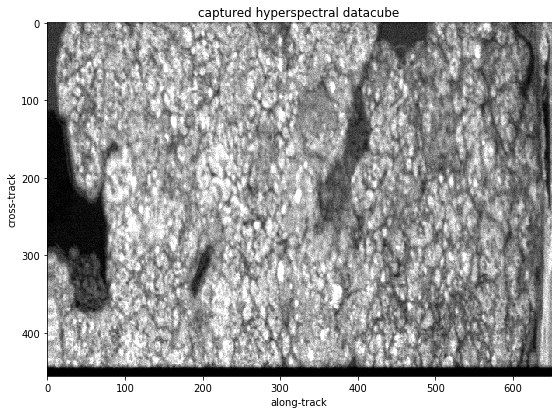

In [214]:
fig.opts(fig_inches=10,title="captured hyperspectral datacube")

## Saving data

I'm attempting to get saving working but currently it seems to not want to...

I don't believe it's something that I have done that is causing this but I can't be sure, it could be that I'm missing some pre-requisite executables.

It seems that you cannot save non-raw data, capturing with `processing_lvl = -1` works just fine though.

In [215]:
cam.save(save_dir = "data/captured-data-bedford-2")
print("capture saved")

capture saved


## Histogram Equalisation

Try with a equalised histogram for interests sake

In [169]:
fig_hist_eq = cam.show(plot_lib="matplotlib", robust=False, hist_eq=True)

/home/solomon/.local/lib/python3.10/site-packages/holoviews/plotting/mpl/plot.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


:RGB   [x,y]   (R,G,B)
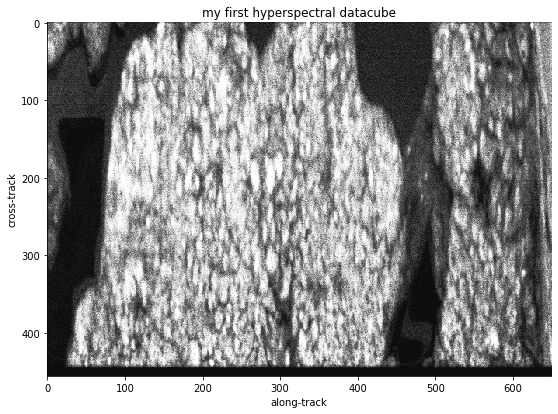

In [170]:
fig_hist_eq.opts(fig_inches=10,title="my first hyperspectral datacube")

## Interactive viewing of datacube

In [106]:
from openhsi.atmos import *
dcv = DataCubeViewer("data/captured-data-sardi/2023_02_27/2023_02_27-03_18_41.nc")
dcv()

Allocated 872.53 MB of RAM.


Column
    [0] Markdown(str)
    [1] HoloViews(DynamicMap)
    [2] HoloViews(DynamicMap)